<a href="https://colab.research.google.com/github/aysebren/car_park_detection/blob/master/GreenAndRedRectanglesTest.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive/


In [ ]:
from google.colab import drive, files
import keras
import keras.utils
from keras.applications.resnet50 import ResNet50
from keras.preprocessing import image
from keras.applications.resnet50 import preprocess_input, decode_predictions
from keras.models import Model
import numpy as np
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.python.keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense, BatchNormalization,GlobalAveragePooling2D
from keras.optimizers import SGD
from keras.optimizers import Adadelta
from keras import backend as K

Using TensorFlow backend.


In [ ]:
import os
os.chdir("drive/My Drive")

In [ ]:
import csv
t=0

file=open( "camera3.csv", "r")
reader = csv.reader(file)

xDim=[0]*(22)
yDim=[0]*(21)
wid=[0]*(21)
heig=[0]*(21)
for line in reader:
    slotId=line[0]
    xDim[t]=int(float(line[1])*(1000/2592))
    yDim[t]=int(float(line[2])*(750/1944))
    wid[t]=int(float(line[3])*(1000/2592))
    heig[t]=int(float(line[4])*(750/1944))
    t=t+1



0


In [ ]:
from keras.models import load_model
initial_lrate=0.01
iteration=200
decay=0.01
lrate = initial_lrate * (1 / (1 + decay * iteration))

model=load_model('mymodelcnr.h5')
model.load_weights('mymodelcnr_weights.h5')
model.compile(loss='categorical_crossentropy',
            optimizer=SGD(lr=lrate),
            metrics=['accuracy'])

In [ ]:
from PIL import Image
import numpy
im = Image.open("dolu_sample_cam_3.jpg").convert('RGB')
np_im = numpy.array(im)
print (np_im.shape)
cols,rows,channel=np_im.shape
print(cols,rows)

(750, 1000, 3)
750 1000


In [ ]:
from PIL import Image
import numpy
im = Image.open("2015-11-16_0845.jpg").convert('RGB')
np_im = numpy.array(im)
print (np_im.shape)
cols,rows,channel=np_im.shape
print(cols,rows)

(750, 1000, 3)
750 1000


In [ ]:
!ls

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
save=[0]*21
t=0
for i in range(0,21):

    im1 = im.crop((xDim[i], yDim[i], xDim[i]+heig[i], yDim[i]+wid[i]))
    im1.resize((224,224),Image.BICUBIC).save("resized "+str(i)+".jpg")

    #plt.imshow(im1)
    #plt.show()

    #im1 = np.expand_dims(im1, axis=0)
    #im1 =im1/255
    #label=model.predict_on_batch(im1)
    #if label[0][0]>label[0][1]:
    #    save[t]=i
    #    t=t+1
#print(save)
# Shows the image in image viewer

In [ ]:
save=[]
green=[]
for i in range(0,21):
  im1 = Image.open("resized "+str(i)+".jpg").convert('RGB')
  im1 = np.expand_dims(im1, axis=0)
  im1 =im1/255
  label=model.predict_on_batch(im1)
  if label[0][0]>label[0][1]:
      save.extend([i])
  else:
      green.extend([i])




[[5.7283651e-05 9.9994266e-01]]
[[1.8631652e-04 9.9981374e-01]]
[[1.9167586e-04 9.9980837e-01]]
[[0.33801967 0.66198033]]
[[0.9164552  0.08354481]]
[[0.21669169 0.7833083 ]]
[[0.02156041 0.9784396 ]]
[[0.31450716 0.6854928 ]]
[[0.14620396 0.853796  ]]
[[0.1774537  0.82254636]]
[[0.30958188 0.6904181 ]]
[[0.99873084 0.00126913]]
[[0.20500177 0.7949982 ]]
[[0.3317203  0.66827965]]
[[0.34687287 0.65312713]]
[[0.9575205  0.04247952]]
[[0.61025727 0.38974273]]
[[0.82746756 0.1725324 ]]
[[0.99667895 0.00332112]]
[[0.03585841 0.96414155]]
[[0.9754082  0.02459176]]
[4, 11, 15, 16, 17, 18, 20]


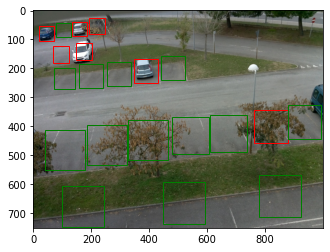

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.pyplot import figure
#fig(num=None, figsize=(8, 6), dpi=80, facecolor='w', edgecolor='k')
# Create figure and axes
fig,ax = plt.subplots(1)

# Display the image
ax.imshow(im)
for i in range(0,len(save)):
# Create a Rectangle patch
    rect = patches.Rectangle((xDim[save[i]],yDim[save[i]]),wid[save[i]],heig[save[i]],linewidth=1,edgecolor='r',facecolor='none')
    ax.add_patch(rect)
for j in range(0,len(green)):
    rect1 = patches.Rectangle((xDim[green[j]],yDim[green[j]]),wid[green[j]],heig[green[j]],linewidth=1,edgecolor='g',facecolor='none')
# Add the patch to the Axes

    ax.add_patch(rect1)



plt.savefig("aaasd.jpg",dpi=1000)
plt.show()

In [ ]:
from PIL import Image
import numpy
im = Image.open("2015-11-27_0717.jpg").convert('RGB')
np_im = numpy.array(im)
print (np_im.shape)
cols,rows,channel=np_im.shape
print(cols,rows)

(750, 1000, 3)
750 1000


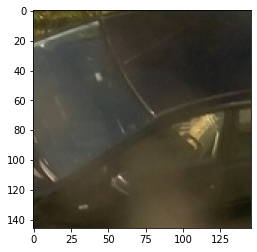

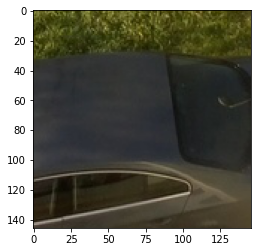

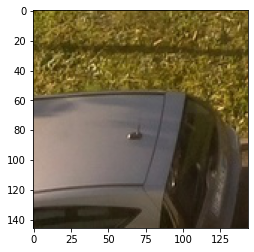

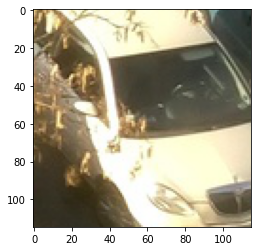

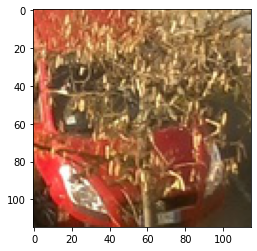

...

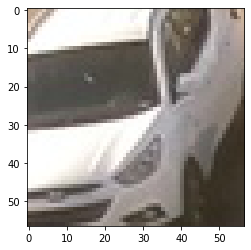

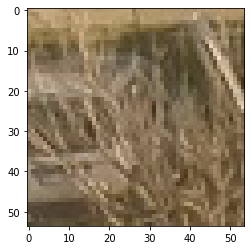

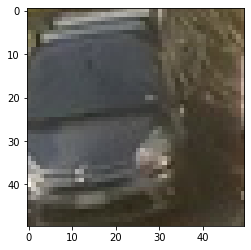

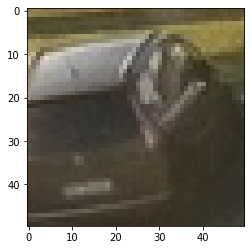

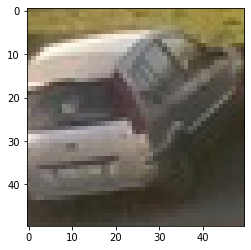

[0, 1, 2, 3, 5, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20, 0, 0, 0]


In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
save=[0]*21
t=0
for i in range(0,21):

    im1 = im.crop((xDim[i], yDim[i], xDim[i]+heig[i], yDim[i]+wid[i]))
    plt.imshow(im1)
    plt.show()

    im1 = np.expand_dims(im1, axis=0)
    im1 =im1/255
    label=model.predict_on_batch(im1)
    if label[0][0]>label[0][1]:
        save[t]=i
        t=t+1
print(save)
# Shows the image in image viewer


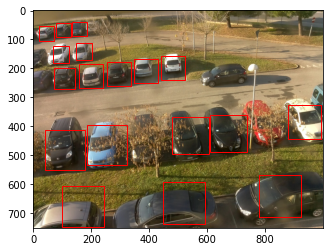

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
# Create figure and axes
fig,ax = plt.subplots(1)

# Display the image
ax.imshow(im)
for i in range(0,21):
# Create a Rectangle patch
    rect = patches.Rectangle((xDim[save[i]],yDim[save[i]]),wid[save[i]],heig[save[i]],linewidth=1,edgecolor='r',facecolor='none')

# Add the patch to the Axes
    ax.add_patch(rect)

plt.show()


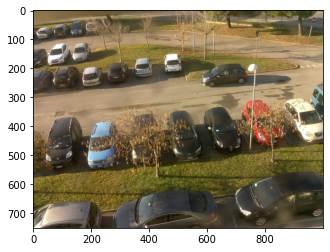

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

img_path = "dolu_sample_cam_3.jpg"#"deneme.tif"#"2015-12-22_1548.jpg"
img = image.load_img(img_path)
plt.imshow(img)
plt.show()

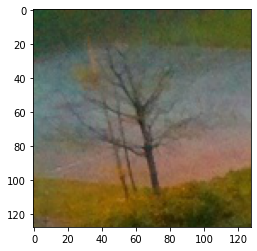

[[0.9927597  0.00724035]]


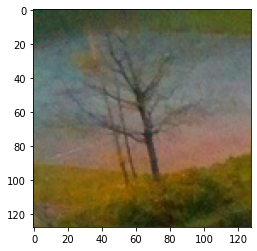

[[9.9993515e-01 6.4799991e-05]]


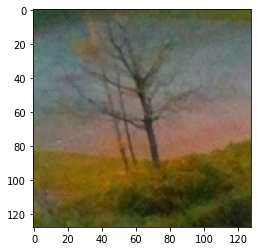

[[9.9997950e-01 2.0455613e-05]]


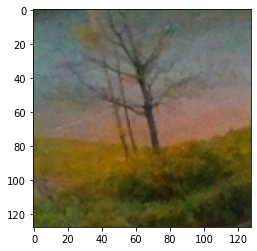

[[0.9933247  0.00667531]]


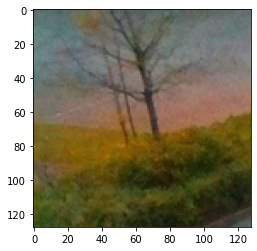

[[9.999449e-01 5.503230e-05]]


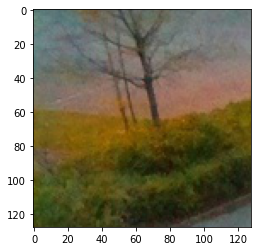

[[9.9982303e-01 1.7700756e-04]]


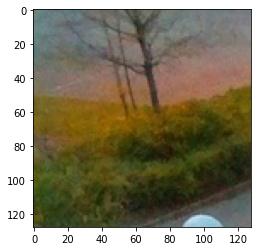

[[9.9997556e-01 2.4462721e-05]]


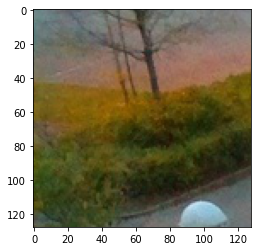

[[9.9999785e-01 2.1013518e-06]]


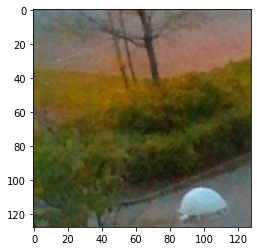

[[9.9997926e-01 2.0783606e-05]]


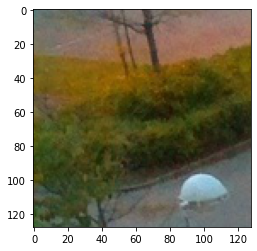

[[9.9993157e-01 6.8378904e-05]]


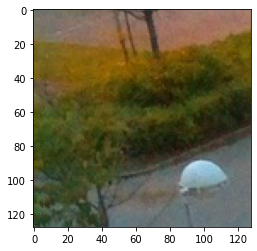

[[9.9999988e-01 1.5547026e-07]]


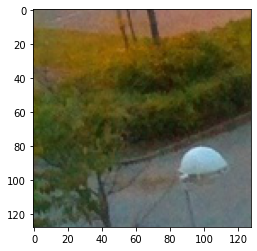

[[9.9998581e-01 1.4187263e-05]]


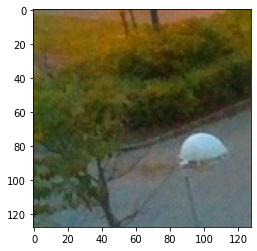

[[0.99852115 0.00147885]]


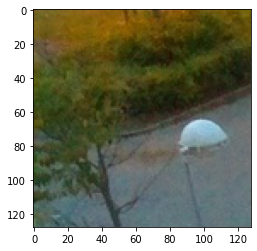

[[0.9522086  0.04779146]]


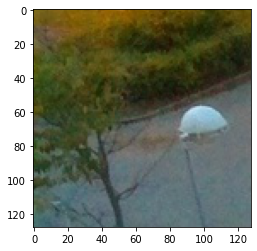

[[0.99151623 0.00848377]]


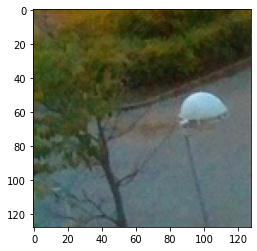

[[0.95566666 0.04433329]]


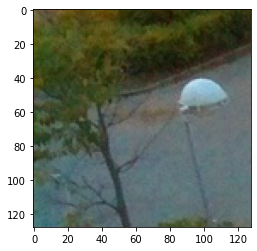

[[0.7969372 0.2030628]]


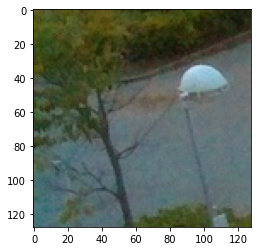

[[0.46982452 0.53017545]]


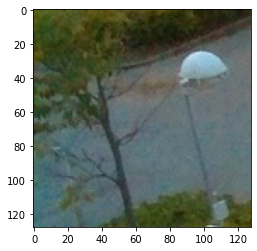

[[0.283053   0.71694696]]


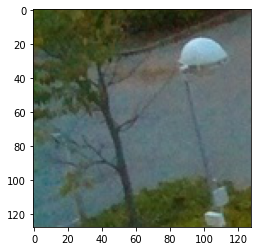

[[0.01164218 0.98835784]]


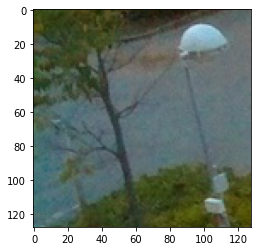

[[0.95118415 0.04881581]]


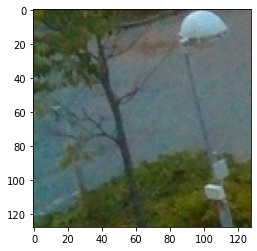

[[0.87334573 0.12665424]]


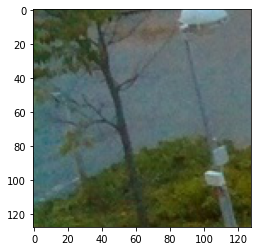

[[0.8414217  0.15857822]]


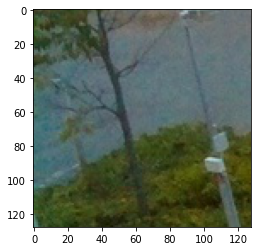

[[0.01531084 0.9846891 ]]


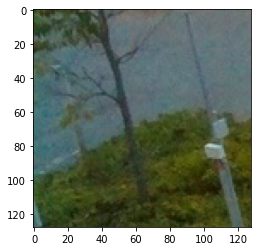

[[0.03568381 0.9643162 ]]


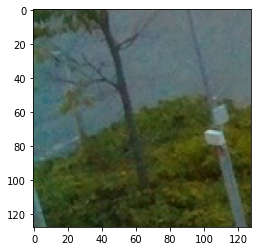

[[3.4031639e-04 9.9965966e-01]]


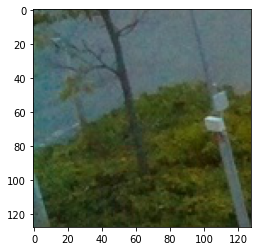

[[1.4768039e-04 9.9985230e-01]]


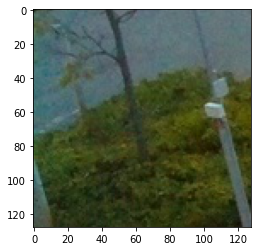

[[2.9988964e-06 9.9999702e-01]]


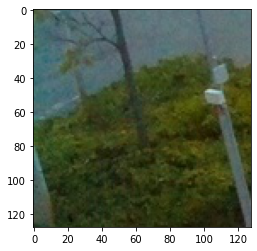

[[8.0500402e-05 9.9991953e-01]]


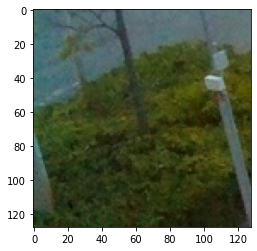

[[2.6723448e-05 9.9997330e-01]]


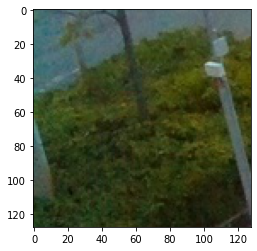

[[4.0179013e-05 9.9995983e-01]]


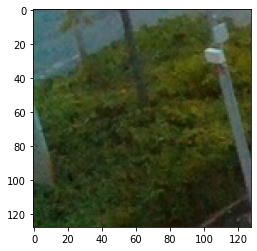

[[3.0025108e-06 9.9999702e-01]]


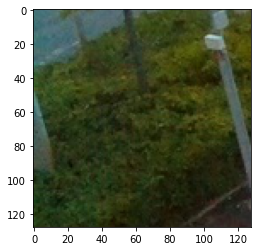

[[5.1398424e-06 9.9999487e-01]]


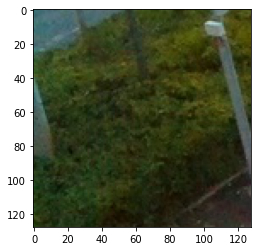

[[6.1744895e-06 9.9999380e-01]]


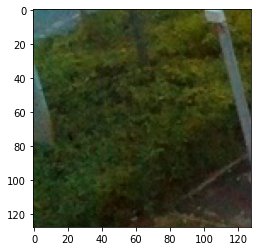

[[1.0805186e-05 9.9998915e-01]]


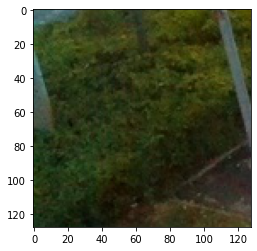

[[2.5805515e-05 9.9997425e-01]]


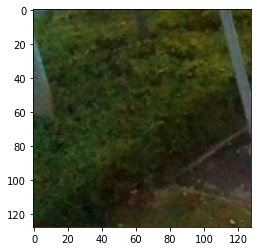

[[1.2921578e-07 9.9999988e-01]]


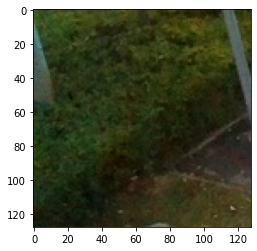

[[9.359042e-08 9.999999e-01]]


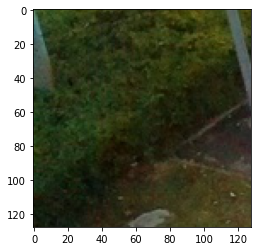

[[1.3762111e-07 9.9999988e-01]]


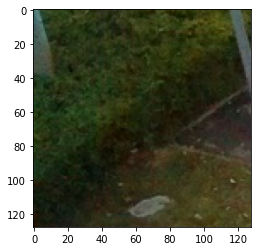

[[9.855445e-09 1.000000e+00]]


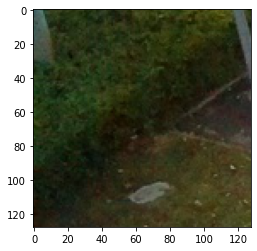

[[9.6560620e-07 9.9999905e-01]]


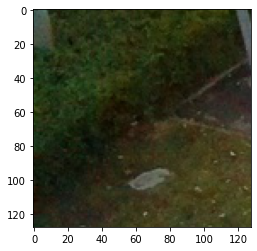

[[1.4959824e-05 9.9998510e-01]]


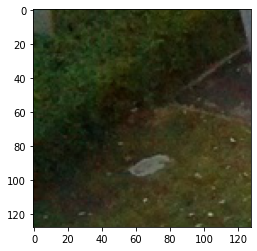

[[3.5867077e-05 9.9996412e-01]]


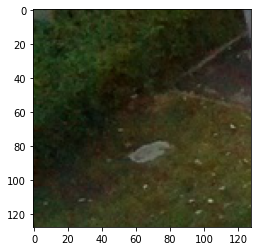

[[0.00312548 0.99687445]]


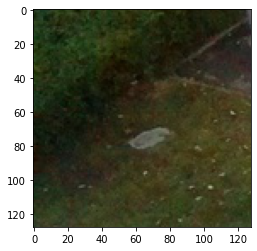

[[7.0973634e-05 9.9992907e-01]]


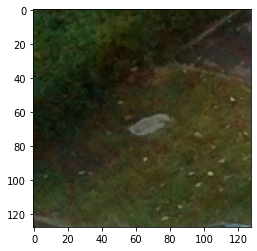

[[8.125226e-05 9.999187e-01]]


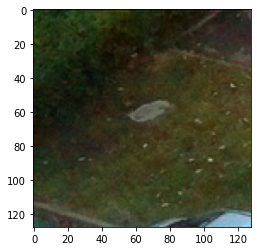

[[0.02143265 0.97856736]]


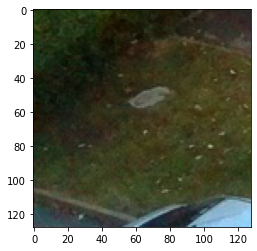

[[0.28360504 0.71639496]]


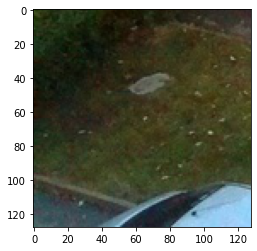

[[0.6102 0.3898]]


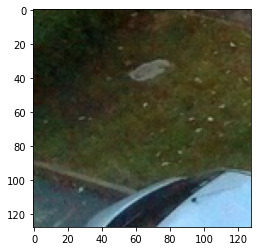

[[0.9054024  0.09459754]]


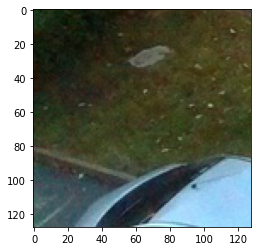

[[0.6284362  0.37156382]]


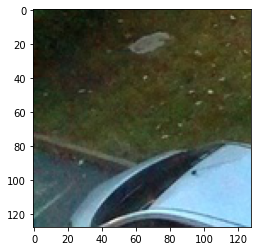

[[0.96870303 0.03129695]]


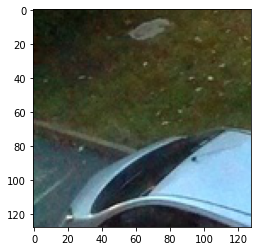

[[0.66597587 0.3340241 ]]


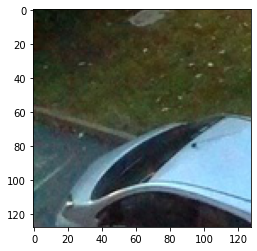

[[0.9134958  0.08650424]]


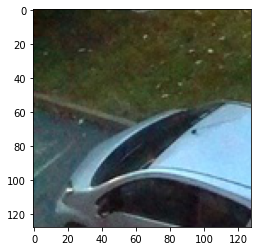

[[9.9990094e-01 9.9088844e-05]]


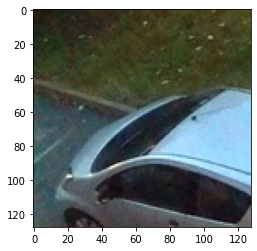

[[9.9998486e-01 1.5188405e-05]]


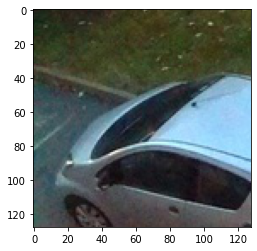

[[9.9993515e-01 6.4890039e-05]]


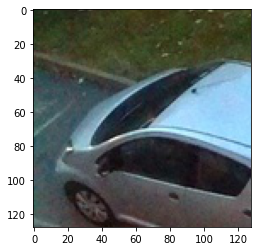

[[9.9990606e-01 9.3950483e-05]]


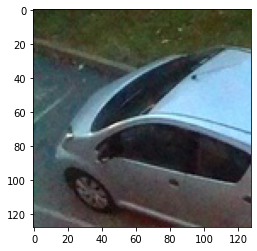

[[0.9862164  0.01378355]]


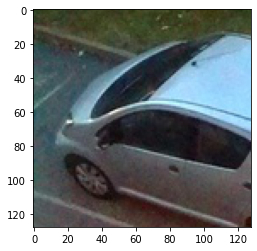

[[9.99985337e-01 1.46066095e-05]]


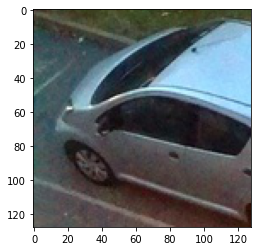

[[9.9998367e-01 1.6329950e-05]]


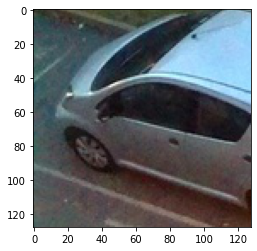

[[9.994320e-01 5.679268e-04]]


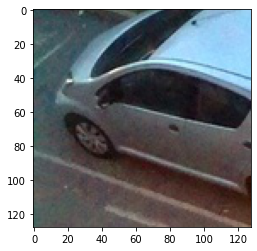

[[9.9960345e-01 3.9655762e-04]]


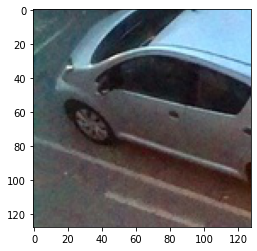

[[9.99886990e-01 1.12976166e-04]]


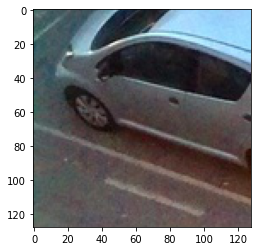

[[9.999269e-01 7.303832e-05]]


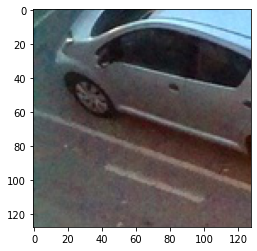

[[0.99125695 0.00874309]]


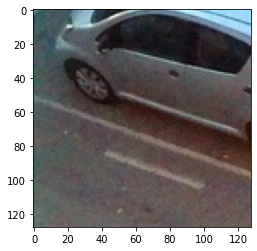

[[0.99373794 0.00626208]]


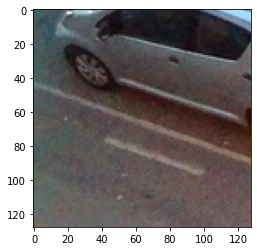

[[0.8043609  0.19563909]]


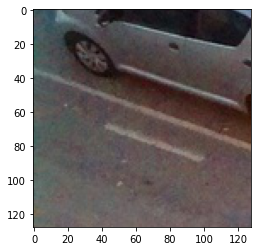

[[0.06825402 0.931746  ]]


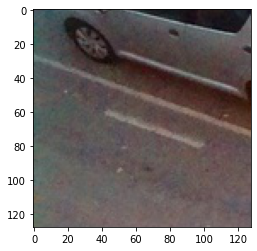

[[0.00611614 0.9938838 ]]


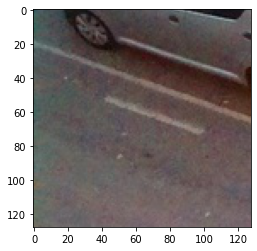

[[0.00287879 0.99712116]]


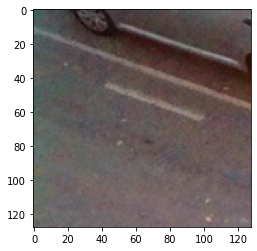

[[8.080804e-05 9.999192e-01]]


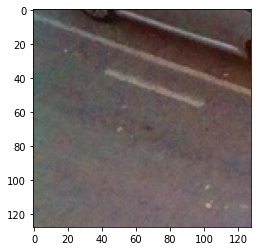

[[5.4431553e-06 9.9999452e-01]]


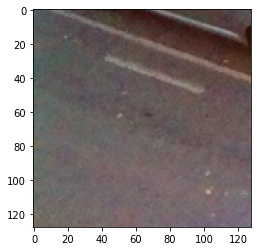

[[9.9843244e-05 9.9990010e-01]]


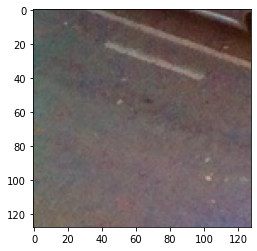

[[2.8716683e-04 9.9971277e-01]]


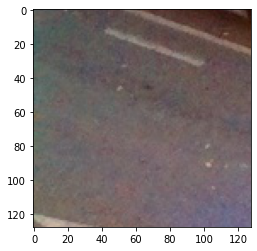

[[0.0044856  0.99551445]]


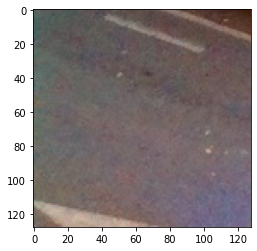

[[5.513915e-04 9.994486e-01]]


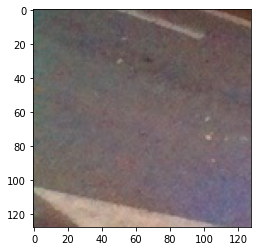

[[3.5705059e-04 9.9964297e-01]]


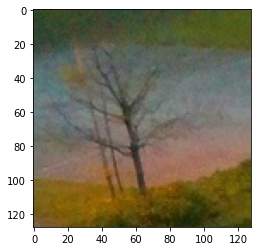

[[0.9986883 0.0013117]]


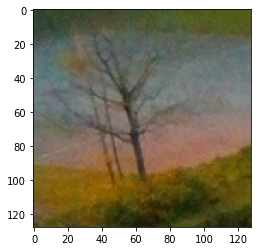

[[9.9996424e-01 3.5807785e-05]]


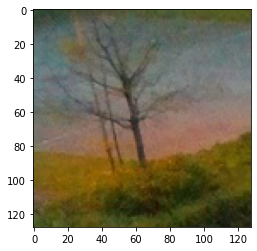

[[9.999838e-01 1.616182e-05]]


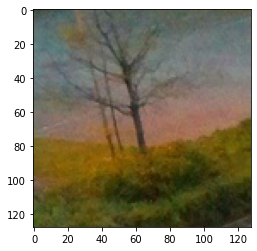

[[9.9995315e-01 4.6819321e-05]]


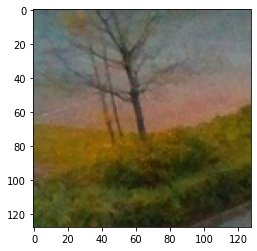

[[9.9972624e-01 2.7377516e-04]]


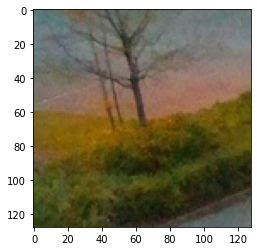

[[9.9999595e-01 4.0798132e-06]]


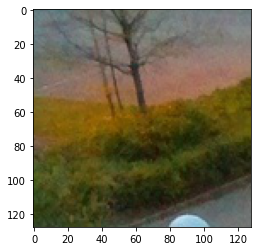

[[9.9943691e-01 5.6308013e-04]]


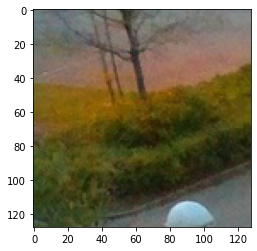

[[9.9999809e-01 1.9598567e-06]]


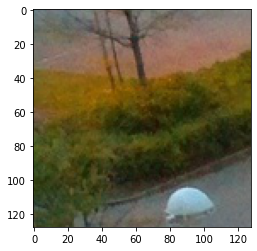

[[9.9924576e-01 7.5426837e-04]]


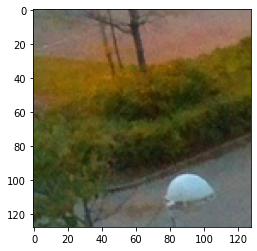

[[9.9999964e-01 3.0637517e-07]]


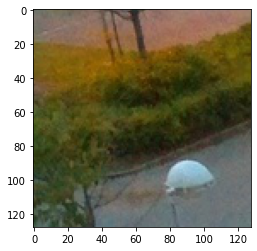

[[9.9999797e-01 2.0356517e-06]]


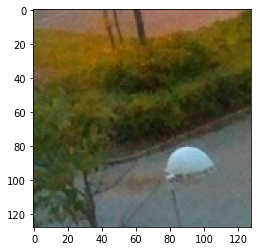

[[9.9997222e-01 2.7728793e-05]]


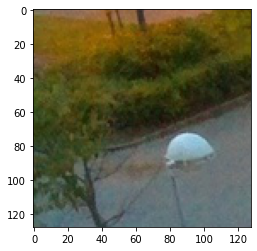

[[0.99285614 0.00714389]]


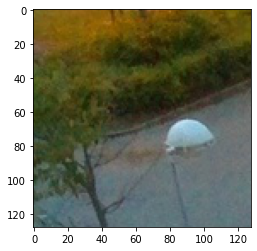

[[0.92952746 0.07047258]]


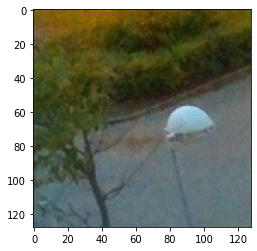

[[0.98281175 0.01718818]]


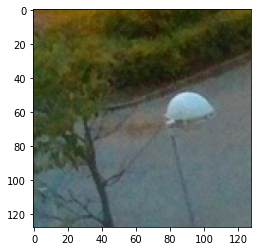

[[0.94454306 0.05545687]]


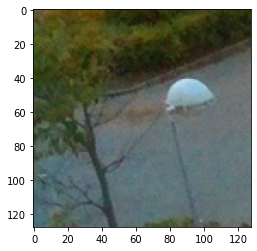

[[0.2124599  0.78754014]]


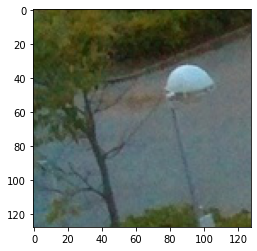

[[0.29199812 0.70800185]]


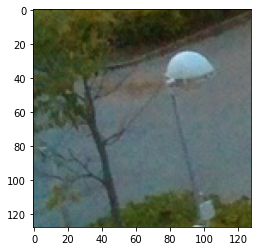

[[0.02359972 0.97640026]]


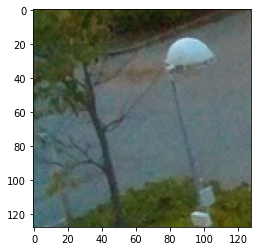

[[0.42663473 0.5733653 ]]


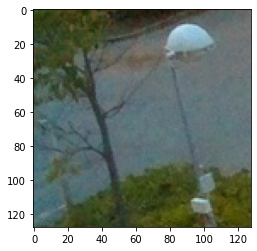

[[0.20171413 0.79828584]]


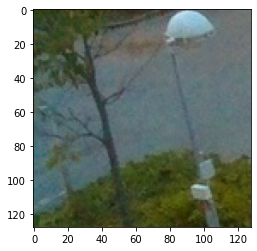

[[0.44929683 0.55070317]]


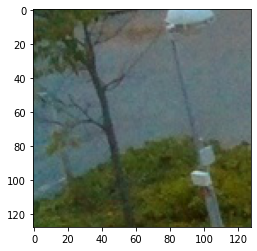

[[0.6430779 0.3569221]]


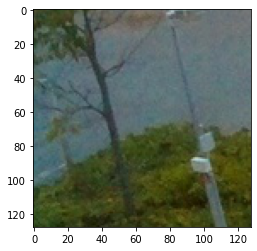

[[0.01954553 0.9804545 ]]


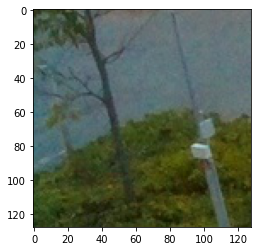

[[0.00475807 0.995242  ]]


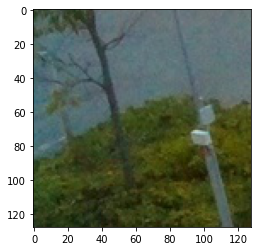

[[1.1604242e-04 9.9988389e-01]]


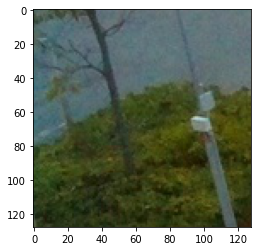

[[2.5507013e-04 9.9974495e-01]]


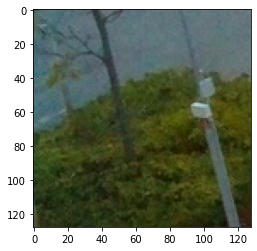

[[1.20945784e-04 9.99879003e-01]]


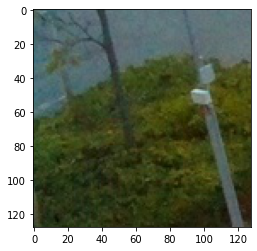

[[4.590215e-05 9.999541e-01]]


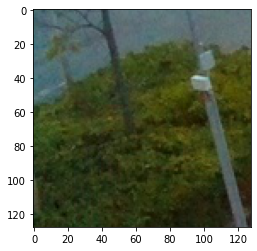

[[4.904758e-06 9.999951e-01]]


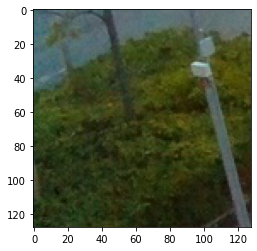

[[9.2704104e-05 9.9990726e-01]]


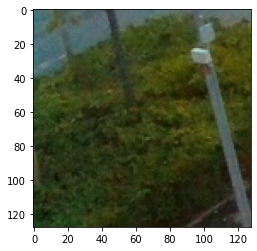

[[5.919746e-04 9.994080e-01]]


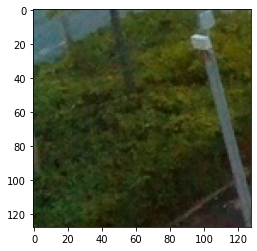

[[2.977137e-04 9.997023e-01]]


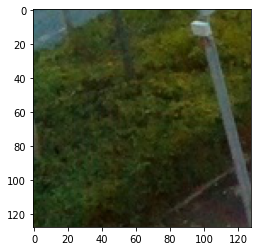

[[3.853430e-05 9.999615e-01]]


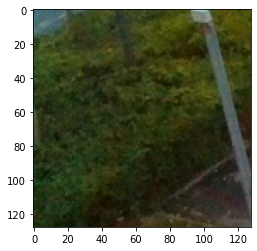

[[2.3322299e-04 9.9976677e-01]]


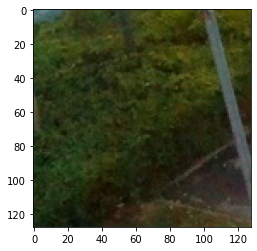

[[6.4956650e-05 9.9993503e-01]]


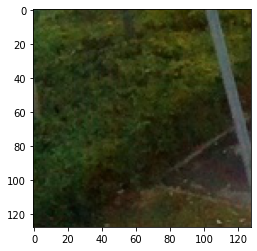

[[3.660471e-08 1.000000e+00]]


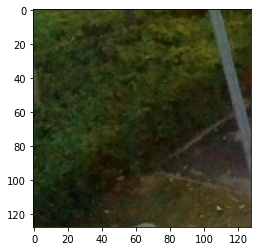

[[9.297370e-06 9.999907e-01]]


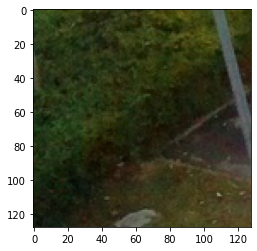

[[9.9208341e-07 9.9999905e-01]]


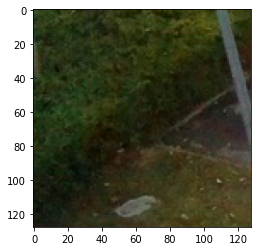

[[1.0905873e-06 9.9999893e-01]]


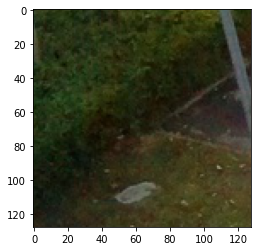

[[1.8475071e-06 9.9999821e-01]]


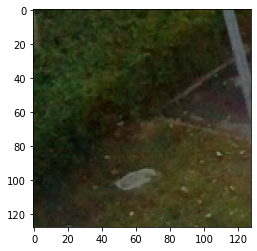

[[7.0064374e-07 9.9999928e-01]]


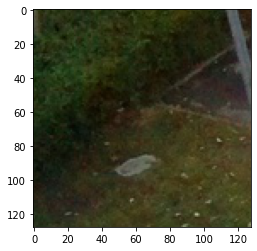

[[3.4186976e-06 9.9999654e-01]]


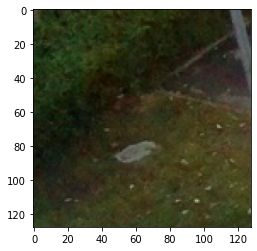

[[2.3198845e-05 9.9997675e-01]]


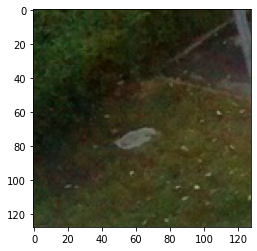

[[4.1683343e-05 9.9995828e-01]]


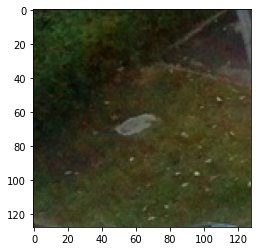

[[1.0506075e-04 9.9989498e-01]]


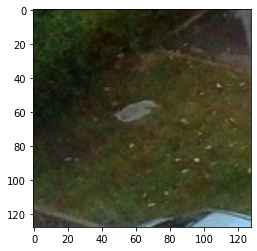

[[0.8128036  0.18719636]]


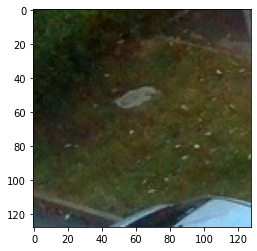

[[0.9670397  0.03296036]]


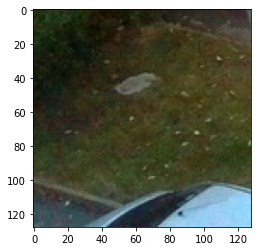

[[0.6210352  0.37896484]]


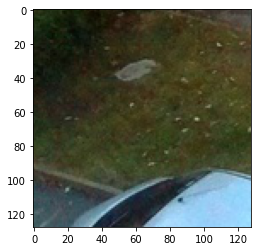

[[0.9933021 0.0066979]]


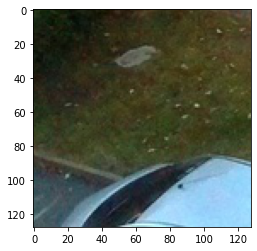

[[0.97524977 0.0247502 ]]


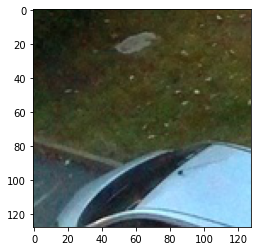

[[0.9806262  0.01937384]]


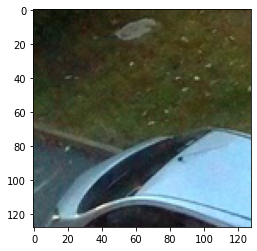

[[0.99607724 0.0039227 ]]


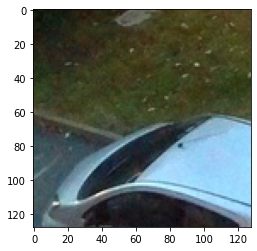

[[0.9792237 0.0207763]]


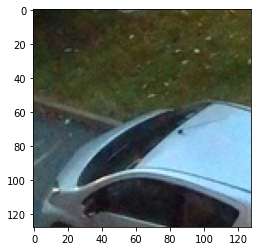

[[9.9999666e-01 3.3814831e-06]]


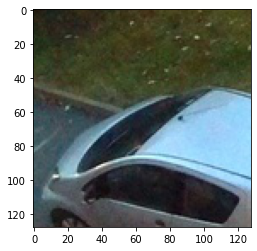

[[9.9999654e-01 3.4671964e-06]]


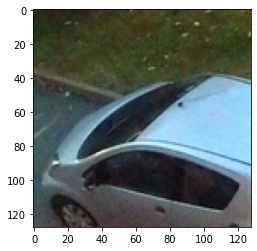

[[9.9999166e-01 8.2950482e-06]]


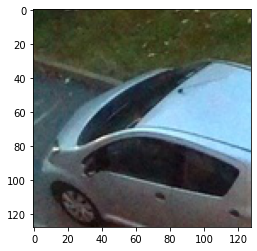

[[9.999167e-01 8.332392e-05]]


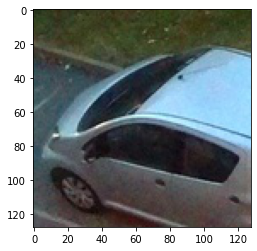

[[9.9980897e-01 1.9108190e-04]]


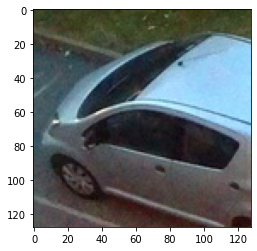

[[9.9999797e-01 2.0768905e-06]]


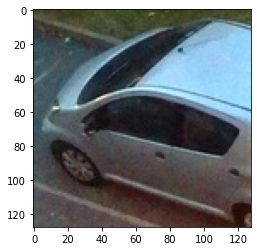

[[9.9999785e-01 2.1360358e-06]]


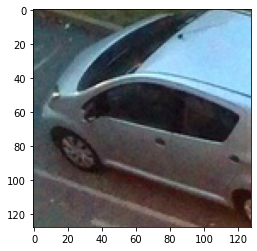

[[9.9996114e-01 3.8804526e-05]]


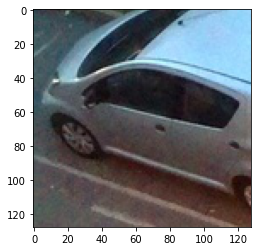

[[9.9994957e-01 5.0478753e-05]]


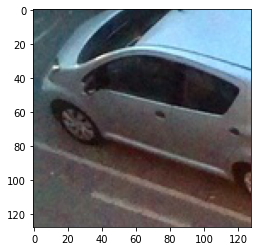

[[9.9999738e-01 2.5853565e-06]]


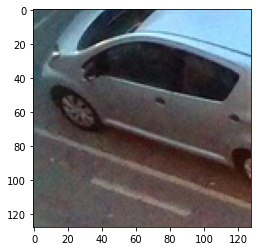

[[9.999970e-01 2.973525e-06]]


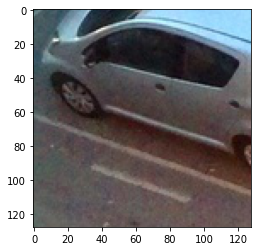

[[9.9998045e-01 1.9506677e-05]]


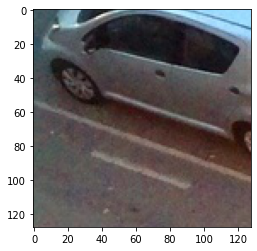

[[9.9940979e-01 5.9016224e-04]]


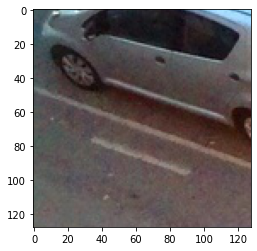

[[0.9067817  0.09321836]]


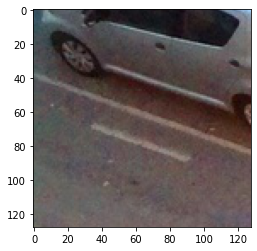

[[0.39084113 0.60915893]]


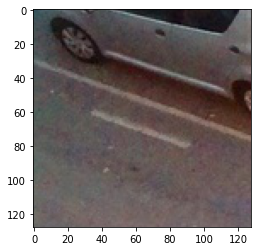

[[0.01989807 0.98010194]]


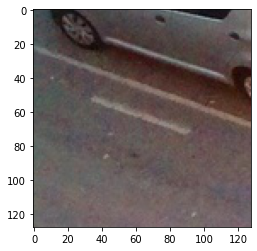

[[0.00952728 0.99047273]]


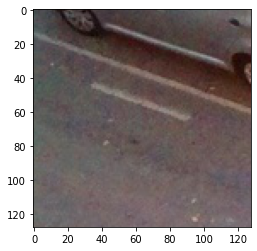

[[0.00126585 0.9987342 ]]


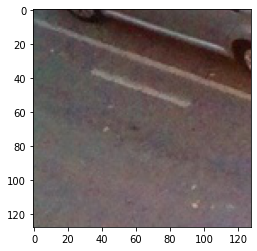

[[1.19930795e-04 9.99880075e-01]]


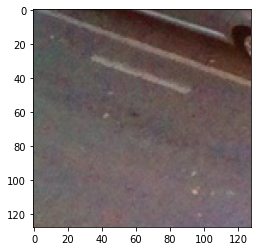

KeyboardInterrupt: ignored

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
def sliding_window(image, stepSize, windowSize):
	# slide a window across the image
  mat = [[[0] * 3] * 128]*128
  for ar in range(0,rows-129,stepSize):
    for y in range(0,cols-129,stepSize):
        for x in range(0,128):
          mat[x]=image[x+y][0+ar:128+ar]

        yield (x,y,mat)

(winW, winH) = (128, 128)


for (x, y, window) in sliding_window(np_im, 8, (winW, winH)):

    plt.imshow(window)
    plt.show()
    window = np.expand_dims(window, axis=0)
    window =window/255
    label=model.predict_on_batch(window)
    print(label)